# Burgers equation
The Burgers equation is a non-linear equation for the advection and
diffusion of momentum. Here we choose to write the Burgers equation in
two dimensions to demonstrate the use of vector function spaces:

\begin{equation}
\frac{\partial u}{\partial t} + (u\cdot\nabla) u - \nu\nabla^2 u = 0 \\
(n\cdot \nabla) u = 0 \ \textrm{on}\ \Gamma
\end{equation}

where $\Gamma$ is the domain boundary and $\nu$ is a
constant scalar viscosity. The solution $u$ is sought in some
suitable vector-valued function space $V$. We take the inner
product with an arbitrary test function $v\in V$ and integrate
the viscosity term by parts:

\begin{equation}
\int_\Omega\frac{\partial u}{\partial t}\cdot v + 
((u\cdot\nabla) u)\cdot v + \nu\nabla u\cdot\nabla v \ \mathrm d x = 0.
\end{equation}

The boundary condition has been used to discard the surface
integral. Next, we need to discretise in time. For simplicity and
stability we elect to use a backward Euler discretisation:

\begin{equation}
\int_\Omega\frac{u^{n+1}-u^n}{dt}\cdot v + 
((u^{n+1}\cdot\nabla) u^{n+1})\cdot v + \nu\nabla u^{n+1}\cdot\nabla v \ \mathrm d x = 0.
\end{equation}



In [ ]:
from firedrake import *
from firedrake.petsc import PETSc
import numpy as np
from mpi4py import MPI

We first need to setup the MPI comm to be able to use time and spatial parallelism.

In [2]:
comm = MPI.COMM_WORLD
if comm.Get_size() > 1:
    manager = Ensemble(COMM_WORLD, 1)
    comm = manager.comm
    PETSc.Sys.Print(
        'Setting up mesh across %d processes.' % manager.global_comm.size)
    PETSc.Sys.Print('Ensemble rank is %3d'
                    % manager.ensemble_comm.Get_rank(),
                    comm=COMM_SELF)
    my_rank_en = manager.ensemble_comm.Get_rank()
    nproc = manager.ensemble_comm.Get_size()
    PETSc.Sys.Print(f'Nproc {nproc}')
    # if my_rank_en == 0:
    #     outfile = File("output/mpi_out.pvd", comm=comm)
else:
    manager = None
    comm = COMM_WORLD
    nproc = 1
    PETSc.Sys.Print(f'Nproc {nproc}')

Nproc 1


Define a class for the Parareal solver

In [3]:
class Parareal:
    """
    Parallel-in-time algorithm
    """

    def __init__(self, solv, u, u0, uk, k, k1, k2, k3, k4, nG, nF, deltaG, deltaF, K):
        """
        """
        
        self.solv = solv
        self.u = u
        self.u0 = u0
        self.uk = uk
        self.k = k
        self.k1 = k1
        self.k2 = k2
        self.k3 = k3
        self.k4 = k4
        self.nG = nG
        self.nF = nF
        self.deltaG = deltaG
        self.deltaF = deltaF
        self.K = K
        self.f = self.u.copy(deepcopy=True)


    def rk4_step(self, dt, u0):

        self.uk.assign(u0)
        self.solv.solve()
        self.k1.assign(self.k)

        self.uk.assign(u0 + dt * self.k1 / 2.0)
        self.solv.solve()
        self.k2.assign(self.k)

        self.uk.assign(u0 + dt * self.k2 / 2.0)
        self.solv.solve()
        self.k3.assign(self.k)

        self.uk.assign(u0 + dt * self.k3)
        self.solv.solve()
        self.k4.assign(self.k)

        self.u.assign(u0 + dt * 1 / 6.0 * (self.k1 + 2.0 * self.k2 + 2.0 * self.k3 + self.k4))
        return self.u


    def coarseIntegratorStep(self, u0):
        """
        single step of the integrator
        """
        # initial coarse integration solution
        return self.rk4_step(self.deltaG, u0) 

    def fineIntegratorStep(self,u0):
        """
        single step of the integrator
        """
        return self.rk4_step(self.deltaF,u0) 

    def parareal(self, V_out):
        """
        Parareal calculation
        nG coarse grid points
        nF fine grid points
        deltaG coarse grid delta t
        deltaF fine grid delta t
        K number of parallel iterations
        f function being integrated
        """

        # yG = np.empty((self.nG + 1, self.K)).tolist()
        yG = [[self.u0.copy(deepcopy=True) for i in range(self.nG +1)] for k in range(self.K)]
        # Initial coarse run through
        PETSc.Sys.Print(f"MPI rank {my_rank_en}", comm=COMM_SELF)
        PETSc.Sys.Print(f"First pass coarse integrator, rank {my_rank_en}")
        if my_rank_en == 0:
            outfile_0 = File(f"output/burgers_parareal_K0.pvd", comm=comm)
            for i in range(1, self.nG + 1):
                yG[0][i].assign(self.coarseIntegratorStep(yG[0][i-1]))
                outfile_0.write(project(yG[0][i], V_out, name="Velocity"))

        yG_correct = yG.copy()
        correction = [[[
            self.u0.copy(deepcopy=True) for j in range(int(self.nF/self.nG)+1)]
            for i in range(self.nG + 1)]
            for k  in range(self.K)]

        # For MPI collecting the final solution from Fine integrator
        correction_collect = [[
            self.u0.copy(deepcopy=True) for i in range(self.nG + 1)]
            for k  in range(self.K)]
        
        for k in range(1, self.K):

            
            PETSc.Sys.Print(f"Doing iteration {k} calculation ... {my_rank_en}", comm=COMM_SELF)
            # outfileFine = File(f"output/burgers_parareal_K{k}_fine.pvd")
            # run fine integrator in parallel for each k interation
            for i in range(self.nG+1):

                # rank 0 initialising the correction with coarse pass through
                if my_rank_en == 0:
                    correction[k-1][i][my_rank_en].assign(yG_correct[k-1][i])
                    correction_collect[k-1][i].assign(yG_correct[k-1][i])
                    manager.send(correction[k-1][i][my_rank_en], my_rank_en + 1)
                # Ranks > 0 recieve calculations done by the previous rank in parallel
                # rank 1 starts with coarse, but the rest with other fine integrator results
                else:
                    manager.recv(self.f, my_rank_en-1)
                    correction[k-1][i][my_rank_en].assign(self.fineIntegratorStep(self.f))
                    # Fine integrator calculation is passed on to the next rank
                    # final rank passes the calculation back to rank 0 for correction later
                    if (my_rank_en < manager.ensemble_comm.Get_size() - 1):
                        manager.send(correction[k-1][i][my_rank_en], my_rank_en + 1)
                    elif (my_rank_en == manager.ensemble_comm.Get_size() -1):
                        manager.send(correction[k-1][i][my_rank_en], 0)
                # Pass the fine integrator calculation to rank 0 for correction step later
                if (my_rank_en == 0):
                    manager.recv(correction_collect[k-1][i], manager.ensemble_comm.Get_size() -1)


            # Predict and correct
            if my_rank_en == 0:
                outfile = File(f"output/burgers_parareal_K{k}.pvd", comm=comm)
                PETSc.Sys.Print(f"Iteration {k} correction rank {my_rank_en}", comm=COMM_SELF)
                for i in range(1, self.nG+1):
                    yG[k][i].assign(self.coarseIntegratorStep(yG_correct[k][i-1]))
                    # yG_correct[k][i].assign((yG[k][i] - yG[k-1][i] + correction[k-1][i][-1]))
                    yG_correct[k][i].assign((yG[k][i] - yG[k-1][i] + correction_collect[k-1][i]))
                    # PETSc.Sys.Print(yG[k][i].dat.data.max(), yG[k-1][i].dat.data.max(), correction[k-1][i][-1].dat.data.max())
                    # PETSc.Sys.Print(yG[k][i].dat.data.max(), yG[k-1][i].dat.data.max(), correction_collect[k-1][i].dat.data.max())
                    outfile.write(project(yG_correct[k][i], V_out, name="Velocity"))


        return yG_correct, correction

Set-up a solver, which can be passed into Parareal as an argument. In the current example, using RK4 defined within Parareal.

In [4]:
class Solver():
    """
    """
    def __init__(self, solv, u, u0, uk, k, k1, k2, k3, k4):
        self.solv = solv
        self.u = u
        self.u0 = u0
        self.uk = uk
        self.k = k
        self.k1 = k1
        self.k2 = k2
        self.k3 = k3
        self.k4 = k4

    def rk4_step(self, dt):

        self.uk.assign(self.u0)
        self.solv.solve()
        self.k1.assign(self.k)

        self.uk.assign(self.u0 + dt * self.k1 / 2.0)
        self.solv.solve()
        self.k2.assign(self.k)

        self.uk.assign(self.u0 + dt * self.k2 / 2.0)
        self.solv.solve()
        self.k3.assign(self.k)

        self.uk.assign(self.u0 + dt * self.k3)
        self.solv.solve()
        self.k4.assign(self.k)

        self.u.assign(self.u0 + dt * 1 / 6.0 * (self.k1 + 2.0 * self.k2 + 2.0 * self.k3 + self.k4))

        return self.u

We can now proceed to set up the problem. We can chooose the resolution and setup a square mesh.

In [5]:
def main_parareal():
    n = 30
    mesh = UnitSquareMesh(n, n, comm=manager.comm)

    # We choose degree 2 continuous Lagrange polynomials. We also need a
    # piecewise linear space for output purposes::

    V = VectorFunctionSpace(mesh, "CG", 2)
    V_out = VectorFunctionSpace(mesh, "CG", 1)


    # We also need solution functions for the current and the next
    # timestep. Note that, since this is a nonlinear problem, we don't
    # define trial functions::

    u0 = Function(V, name="Velocity")
    uk = Function(V, name="Velocity")
    k = Function(V, name="Velocity")
    k1 = Function(V, name="Velocity")
    k2 = Function(V, name="Velocity")
    k3 = Function(V, name="Velocity")
    k4 = Function(V, name="Velocity")

    u = Function(V, name="VelocityNext")
    v = TestFunction(V)

    # For this problem we need an initial condition::

    x = SpatialCoordinate(mesh)
    ic = project(as_vector([sin(pi * x[0]), 0]), V)

    # We start with current value of u set to the initial condition, but we
    # also use the initial condition as our starting guess for the next
    # value of u::

    u0.assign(ic)
    u.assign(ic)

    nu = 0.000001

    # lhs
    du_trial = TrialFunction(V)
    a = inner(du_trial, v) * dx
    # rhs

    L1 = (-inner(dot(uk, nabla_grad(uk)), v) + nu * inner(grad(uk), grad(v))) * dx

    prob1 = LinearVariationalProblem(a, L1, k)
    solv1 = LinearVariationalSolver(prob1)

    # :math:`\nu` is set to a (fairly arbitrary) small constant value::

    t = 0.0
    end = 0.2

    K = 5 
    nG = 100
    nF = (nproc-1)* nG
    PETSc.Sys.Print(nF)
    xG = np.linspace(t,end,nG+1)
    deltaG = (end - t)/nG
    xF = np.zeros((nG,int(nF/nG)+1))
    for i in range(nG):
        left,right = xG[i], xG[i+1]
        xF[i,:] = np.linspace(left,right,int(nF/nG)+1)
    deltaF = float(xF[0,1] - xF[0,0])
    
    solver = Parareal(solv1, u, u0, uk, k, k1, k2, k3, k4, nG, nF, deltaG, deltaF, K)
    #yG_correct shape: [K][nG]
    #correction shape: [K][nG][nF/nG+1]
    
    yG_correct, correction = solver.parareal(V_out)

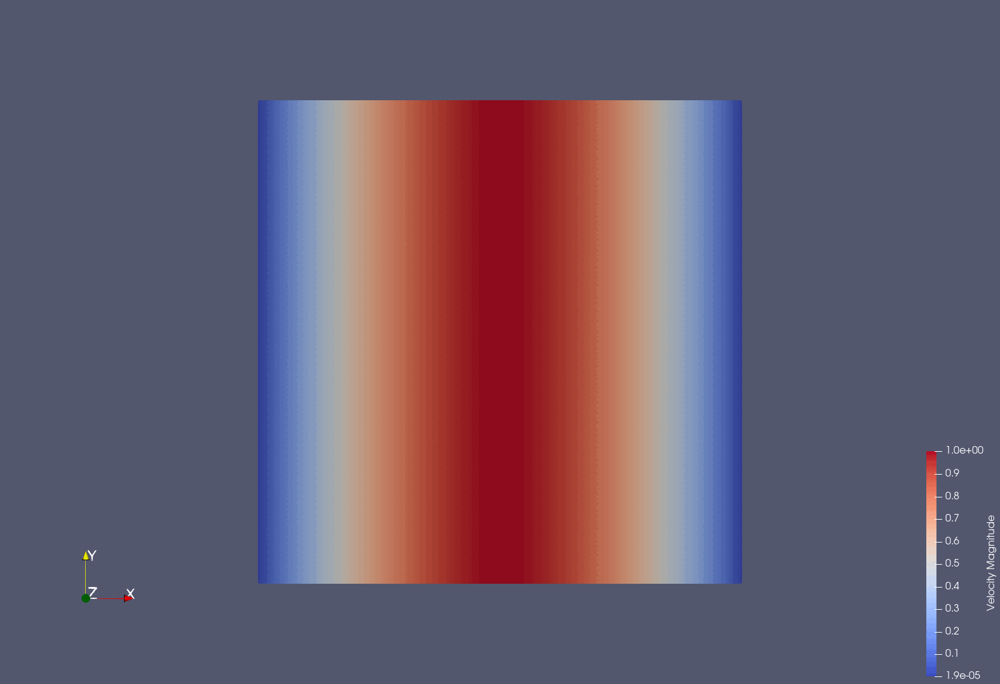

In [6]:
from IPython.display import Image
with open('output/burgers_para.gif', 'rb') as file:
    display(Image(file.read()))
    